# Illustration: Sampling algorithms (MH vs HMC)

In this notebook, we study the performance of two Markov Chain Monte Carlo algorithms (Metropolis–Hastings (MH) and Hamiltonian Monte Carlo (HMC)) for sampling from the latent space model used in the Florentine families network. Our goal is to compare how both algorithms behave when the latent positions are assumed to lie either in the Euclidean space $\mathbb{R}^3$ or on the spherical manifold $\mathbb{S}^2$.

The target distribution comes from the posterior of the latent space model, where each configuration of latent positions defines the likelihood of the observed network. Sampling from this posterior is demanding because the geometry can be highly curved, especially on $\mathbb{S}^2$, and this directly affects algorithmic efficiency.

We will focus on:

1. **Metropolis–Hastings (MH):**  
   A classical MCMC algorithm based on proposing new latent positions and accepting them according to the posterior ratio.

2. **Hamiltonian Monte Carlo (HMC):**  
   A gradient-based MCMC method that uses Hamiltonian dynamics adapted to either $\mathbb{R}^3$ or $\mathbb{S}^2$, producing more informed proposals and often improving mixing.

Our objectives are:

- Compare the mixing and efficiency of MH and HMC in both geometries.  
- Highlight how the underlying space ($\mathbb{R}^3$ vs $\mathbb{S}^2$) influences the sampling behavior.  
- Visualize and interpret the resulting posterior samples for the Florentine families network.

We are going to use the following libraries:


In [1]:
import sys
import os
sys.path.append(os.path.abspath("..//.."))


from LSMN_P import *

## Network

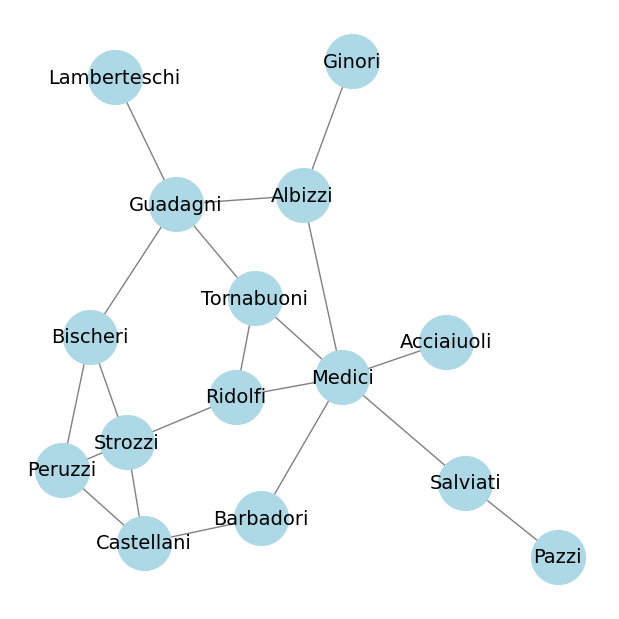

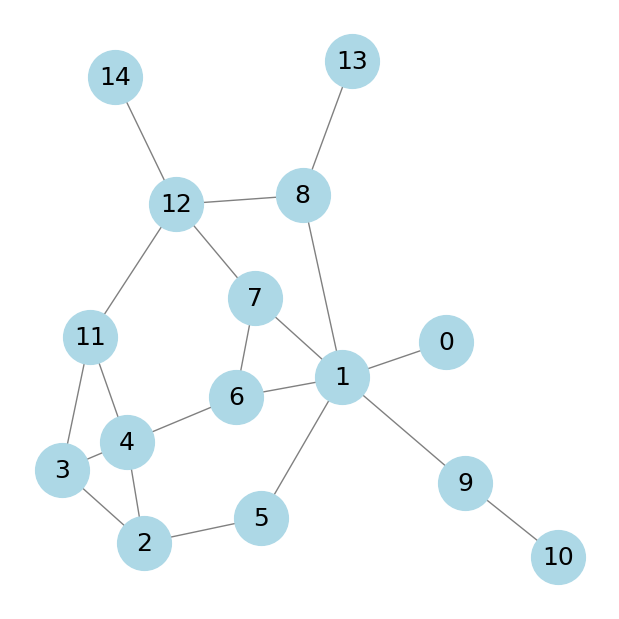

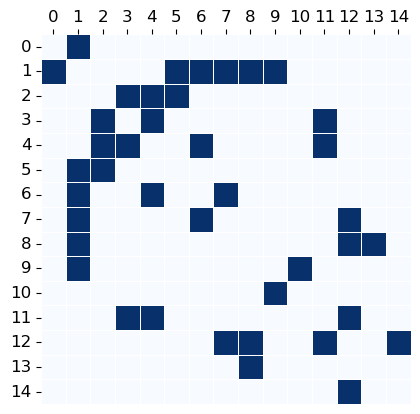

In [2]:
G = nx.florentine_families_graph()
pos = nx.spring_layout(G, seed=80)
plt.figure(figsize=(6,6))
nx.draw(G, pos=pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=1500, font_size=14)
#plt.title("Florentine Families network")
plt.show()

G = nx.florentine_families_graph()
node_mapping = {node: i for i, node in enumerate(G.nodes())}
G = nx.relabel_nodes(G, node_mapping)
n = len(G.nodes)
plt.figure(figsize=(6,6))
pos_relabel = {node_mapping[k]: v for k, v in pos.items()}
nx.draw(G,  pos=pos_relabel, with_labels=True, node_color='lightblue', edge_color='gray', node_size=1500, font_size=18)
#plt.title("Florentine Families network with relabeled nodes")
plt.show()
#print("Map from original nodes to new nodes:")
#print(node_mapping)

Y = nx.to_numpy_array(G, dtype=float)

sns.heatmap(Y, annot=False, cmap="Blues", cbar=False, square=True, linewidths=0.5, linecolor='white')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.gca().xaxis.tick_top() 
plt.gca().tick_params(top=True, bottom=False, labeltop=True, labelbottom=False, labelsize=12)
#plt.title("Sociomatrix for Florentine families")
plt.show() 

## Buiding functions

In [3]:


def Estimation_LSMN_Samplers(Y, Theta, Model):
    """
    Performs Bayesian estimation for Latent Space Models on Networks (LSMN) using a Metropolis-Hastings (MH) and Hamiltonian Monte Carlo (HMC) algorithms.

    This function supports two types of latent space models: "Euclidean" and "Spherical". It first finds a Maximum Likelihood Estimate (MLE) to initialize the chains and then runs multiple MCMC chains to sample from the posterior distribution of the parameters. 
    The parameters include latent positions (Z) and model-specific parameters (alpha and beta).

    The process includes:
    1.  **Multi-start Gradient Ascent:** A search for a good initial parameter value (MLE) to improve MCMC convergence.
    2.  **Metropolis-Hastings Sampling:** Iteratively proposes and accepts/rejects new parameter values to generate posterior samples.
    3.  **Adaptive Tuning:** The proposal distributions are adjusted during burn-in to maintain optimal acceptance rates.
    4.  **Post-processing:** Aligns the latent positions (Z) using Procrustes analysis and computes various convergence diagnostics (R-hat, ESS) and model fit criteria (WAIC, DIC, BIC).

    Returns a dictionary containing MCMC samples, point estimates (MLE, Conditional Mean, MAP), diagnostics, and information criteria.

    Parameters:
    -   Y (array): The network's adjacency matrix.
    -   Theta (dict): A dictionary of initial parameters and settings for the MH and HMC algorithms.
    -   Model (str): The type of latent space model, either "Euclidean" or "Spherical".
    """
    

    print("="*80)   
    print(f"MH and HMC for {Model} latent space models on networks")
    print("="*80)

    min_ar, max_ar = 0.3, 0.5
    
    n = Y.shape[0]
    Z0 = Theta['Z0']
    alpha0 = Theta['alpha0']
    if Model == "Spherical": beta0 = Theta['beta0']
    if Model == "Euclidean": sigma_prior_Z = Theta['sigma_prior_Z']
    sigma_prior_alpha = Theta['sigma_prior_alpha']
    if Model == "Spherical": 
        sigma_prior_beta = Theta['sigma_prior_beta']
        rho = Theta['rho'] 
        mu_alpha_beta = Theta['mu_alpha_beta'] 

    d = Z0.shape[1]

    n_samples = Theta['n_samples']
    sigma_q_Z = Theta['sigma_q_Z']
    sigma_q_alpha = Theta['sigma_q_alpha']
    if Model == "Spherical": sigma_q_beta = Theta['sigma_q_beta']
    burn_in = Theta['burn_in']
    thin = Theta['thin']
    n_iterations = n_samples * thin + burn_in
    n_chains = Theta['n_chains']    

    mask = np.arange(burn_in, n_iterations, thin)

    print(f"Number of chains: {n_chains}")
    print(f"MH samples of size {n_samples} with burn-in {burn_in} and thinning {thin}")
    print(f"Number of draws per chain: {n_iterations}")
    

    

    print(f"Initial sigma_q_Z: {sigma_q_Z:.4f}")
    print(f"Initial sigma_q_alpha: {sigma_q_alpha:.4f}")
    if Model == "Spherical": print(f"Initial sigma_q_beta: {sigma_q_beta:.4f}")

    
    if Model == "Euclidean":
        def compute_Z_star(Z, Z0):
            """ Computes Z* = Z0 Z^T (Z Z0^T Z0 Z^T)^(-1/2) Z using SVD """
            A = Z @ Z0.T @ Z0 @ Z.T 
            U, S, _ = np.linalg.svd(A)
            S_inv_sqrt = np.diag(1.0 / (np.sqrt(S) + 1e-10))
            A_inv_sqrt = U @ S_inv_sqrt @ U.T
            Z_star =  Z0 @ Z.T @ A_inv_sqrt @ Z
            # Compute Z*
            return Z_star - np.mean(Z_star, axis=0)
    if Model == "Spherical":
        def compute_Z_star(Z, Z0):
            """
            Orthogonal Procrustes alignment following Schönemann (1966):
            Finds rotation R = V U^T such that Z @ R best approximates Z0.
            """
            Z = np.asarray(Z)
            Z0 = np.asarray(Z0)
            M = Z0.T @ Z
            U, S, Vt = np.linalg.svd(M)

            R = Vt.T @ U.T
            Z_star = Z @ R

            return Z_star

    print("Log-likelihood: Bernoulli")
    def log_likelihood(params):
        if Model == "Euclidean":
            Z, alpha = params
            diff = Z[:, None, :] - Z[None, :, :]
            dist = np.sqrt(np.sum(diff**2, axis=2))
            i, j = np.triu_indices(n, k=1)
            dist_ij = dist[i, j]
            eta = alpha - dist_ij
            return np.sum(eta * Y[i, j] - np.logaddexp(0, eta))
        if Model == "Spherical":
            Z, alpha, beta = params
            dist = Z @ Z.T
            i, j = np.triu_indices(n, k=1)
            dist_ij = dist[i, j]
            eta = alpha + beta * dist_ij
            return np.sum(eta * Y[i, j] - np.logaddexp(0, eta))
    
    from scipy.special import expit

    def grad_loglikelihood(params):
        if Model == "Euclidean":
            Z, alpha = params
            diff = Z[:, None, :] - Z[None, :, :]
            dist = np.sqrt(np.sum(diff**2, axis=2)) + 1e-10
            i, j = np.triu_indices(n, k=1)
            dist_ij = dist[i, j]
            diff_ij = diff[i, j]  # shape (m, d), m=n*(n-1)/2
            eta = alpha - dist_ij
            factor = (Y[i, j] - expit(eta))
            grad_Z = np.zeros_like(Z)
            grad_Z[i] += -factor[:, None] * (diff_ij / dist_ij[:, None])
            grad_alpha = np.sum(factor)
            return grad_Z, grad_alpha
        if Model == "Spherical":
            Z, alpha, beta = params
            dist = Z @ Z.T
            i, j = np.triu_indices(n, k=1)
            dist_ij = dist[i, j]
            eta = alpha + beta * dist_ij
            factor = (Y[i, j] - expit(eta))
            grad_Z = np.zeros_like(Z)
            grad_Z[i] += (factor * beta)[:, None] * Z[j]
            grad_alpha = np.sum(factor)
            grad_beta = np.sum(factor * dist_ij)
            return grad_Z, grad_alpha, grad_beta


    

    print("-"*60)

    def SearchingMLE(params, max_iter=250, tol=1e-3, r_init=0.1, rho=0.5, c=1e-4):

        if Model == "Euclidean":
            Z0, alpha0 = params
        if Model == "Spherical":
            Z0, alpha0, beta0 = params
        
        def update_Z(Z, grad_Z):
            for i in range(len(Z)):
                proj_orth = grad_Z[i]-np.dot(Z[i], grad_Z[i]) * Z[i]
                Z[i] = Z[i] + proj_orth 
                Z[i] = Z[i] / np.linalg.norm(Z[i])
            return Z

        Zi = Z0.copy()
        alphai = np.float64(alpha0).copy()
        historyZ = [Zi]
        historyalpha = [alphai]
        if Model == "Spherical": 
            betai = np.float64(beta0).copy()
            historybeta = [betai]

        for i in range(max_iter):
            r = r_init
            if Model == "Euclidean":
                grad_Z, grad_alpha = grad_loglikelihood((Zi,alphai))
                while log_likelihood((Zi + r * grad_Z, alphai+r*grad_alpha)) < log_likelihood((Zi,alphai))+ c * r * (np.sum(grad_Z * grad_Z) + grad_alpha**2):
                    r *= rho
                    if r < 1e-9:
                        r = 0.0
                        break
            if Model == "Spherical":
                grad_Z, grad_alpha, grad_beta = grad_loglikelihood((Zi,alphai,betai))
                while  log_likelihood((update_Z(Zi, r*grad_Z) ,alphai+r*grad_alpha,betai+r*grad_beta)) < log_likelihood((Zi,alphai,betai))+ c * r * (np.sum(grad_Z * grad_Z) + grad_alpha**2 + grad_beta**2):
                    r *= rho
                    if r < 1e-9:
                        r = 0.0
                        break
            
            if Model == "Euclidean":
                Zi = Zi + r * grad_Z  
                alphai = alphai + r * grad_alpha
                historyZ.append(Zi)
                historyalpha.append(alphai)
                if np.linalg.norm(grad_Z) < tol and np.abs(grad_alpha) < tol:
                    break
            if Model == "Spherical":
                Zi = update_Z(Zi, r * grad_Z) 
                alphai = alphai + r * grad_alpha
                betai = betai + r * grad_beta
                historyZ.append(Zi)
                historyalpha.append(alphai)
                historybeta.append(betai)
                if np.linalg.norm(grad_Z) < tol and np.abs(grad_alpha) < tol and np.abs(grad_beta) < tol:
                    break


        if Model == "Euclidean":  
            return  Zi, alphai
        if Model == "Spherical":
            return  Zi, alphai, betai
            
    def MultiStartMLE(n_starts=10, max_iter=150, tol=1e-3):
        print("Searching for MLE using gradient ascent")
        best_ll = -np.inf
        best_params = None

        for s in range(n_starts):
            # Random initialization
            Z0 = np.random.randn(n, d)
            Z0 = Z0 / np.linalg.norm(Z0, axis=1, keepdims=True) if Model == "Spherical" else sigma_prior_Z * Z0
            alpha0 = sigma_prior_alpha * np.random.normal()
            if Model == "Spherical":
                alpha_beta_0 = np.random.multivariate_normal(mu_alpha_beta , np.array([[sigma_prior_alpha**2,rho*sigma_prior_alpha*sigma_prior_beta],[rho*sigma_prior_alpha*sigma_prior_beta,sigma_prior_beta**2]]), size=1)
                alpha0 = np.float64(alpha_beta_0[0,0])
                beta0 = np.float64(alpha_beta_0[0,1])
            # Run optimization
            if Model == "Euclidean":
                params = SearchingMLE((Z0,alpha0), max_iter=max_iter, tol=tol)
                ll = log_likelihood(params)
            if Model == "Spherical":
                params = SearchingMLE((Z0,alpha0,beta0),max_iter=max_iter, tol=tol)
                ll = log_likelihood(params)
            if ll > best_ll:
                best_ll = ll
                best_params = params

        print(f"Best log-likelihood after {n_starts} starts: {best_ll:.4f}")
        return best_params



    if Model == "Euclidean":
        Z_ML, alpha_ML = MultiStartMLE(n_starts=20)
    if Model == "Spherical":
        Z_ML, alpha_ML, beta_ML = MultiStartMLE(n_starts=20) 
        
    print("-"*60)    

    print("Log-prior:")
    if Model == "Euclidean": print("sigma_prior_Z: ", sigma_prior_Z)
    print("sigma_prior_alpha: ", sigma_prior_alpha)
    if Model == "Spherical": print("sigma_prior_beta: ", sigma_prior_beta)
    
    def log_prior(params):
        total = 0.0
        if Model == "Euclidean":
            Z, alpha = params
            total += - 0.5 * n * d * np.log(2 * np.pi)- n * np.log(sigma_prior_Z) - 0.5 * np.sum(Z**2) / sigma_prior_Z**2
            total += - 0.5 * np.log(2 * np.pi)- np.log(sigma_prior_alpha) - 0.5 * alpha**2 / sigma_prior_alpha**2
        if Model == "Spherical":
            Z, alpha, beta = params
            total += - 0.5 * n * d * np.log(np.pi) - n * np.log(d) + n * np.log(scipy.special.gamma(d/2 + 1))
            Sigma_prior_inv = (1/(sigma_prior_alpha**2 * sigma_prior_beta**2 * (1 - rho**2))) * np.array([[sigma_prior_beta**2,-rho*sigma_prior_alpha*sigma_prior_beta],[-rho*sigma_prior_alpha*sigma_prior_beta,sigma_prior_alpha**2]])
            total += - np.log(2 * np.pi)- np.log(sigma_prior_alpha*sigma_prior_beta*np.sqrt(1-rho**2)) - 0.5 * ((np.array([alpha, beta]) - mu_alpha_beta).T @ Sigma_prior_inv @ (np.array([alpha, beta]) - mu_alpha_beta))
        return total
    
    def grad_logprior(params):
        if Model == "Euclidean":
            Z, alpha = params
            grad_Z = - Z / (sigma_prior_Z**2)
            grad_alpha = - alpha / (sigma_prior_alpha**2)
            return grad_Z, grad_alpha
        if Model == "Spherical":
            Z, alpha, beta = params
            grad_Z = np.zeros_like(Z)
            Sigma_inv = (1 / (sigma_prior_alpha**2 * sigma_prior_beta**2 * (1 - rho**2))) * np.array([
                [ sigma_prior_beta**2,              -rho*sigma_prior_alpha*sigma_prior_beta ],
                [ -rho*sigma_prior_alpha*sigma_prior_beta,  sigma_prior_alpha**2 ]
            ])
            diff = np.array([alpha, beta]) - mu_alpha_beta
            grad_alpha_beta = - Sigma_inv @ diff
            grad_alpha = grad_alpha_beta[0]
            grad_beta  = grad_alpha_beta[1]
            return grad_Z, grad_alpha, grad_beta

    
    




    print("-"*60)
    print("Starting MCMC sampling using Metropolis-Hastings")
    results_per_chain = []
    for chain in range(n_chains):

        sigma_q_Z = Theta['sigma_q_Z']
        sigma_q_alpha = Theta['sigma_q_alpha']
        if Model == "Spherical": sigma_q_beta = Theta['sigma_q_beta']

        Z_current = Z_ML.copy()
        alpha_current = np.float64(alpha_ML).copy()
        if Model == "Spherical": beta_current = np.float64(beta_ML).copy()

        Z_chain = np.zeros((n_iterations, n, d))
        alpha_chain = np.zeros(n_iterations)
        if Model == "Spherical": beta_chain = np.zeros(n_iterations)

        acceptance_rate_trace_Z = np.zeros(n_iterations)
        acceptance_rate_trace_alpha = np.zeros(n_iterations)
        if Model == "Spherical": acceptance_rate_trace_beta = np.zeros(n_iterations)

        log_likelihood_chain = np.zeros(n_iterations)
        log_prior_chain = np.zeros(n_iterations)
        log_posterior_chain = np.zeros(n_iterations)

        accept_count_Z = 0
        total_updates_Z = 0

        accept_count_alpha = 0
        total_updates_alpha = 0

        if Model == "Spherical":
            accept_count_beta = 0
            total_updates_beta = 0

        if Model == "Euclidean":
            params_current = (Z_current,alpha_current)
            current_ll = log_likelihood(params_current)
            current_lp = log_prior(params_current)
        if Model == "Spherical":
            params_current = (Z_current,alpha_current,beta_current)
            current_ll = log_likelihood(params_current)
            current_lp = log_prior(params_current)
        current_post = current_ll + current_lp


        

        

        print("*"*32 + f"\nChain {chain}\n" + "*"*32)

        for i in tqdm(range(n_iterations), desc="Sampling progress in MH", unit=" draws"):

            # Z update      
            for l in range(n):
                if Model == "Euclidean":
                    Z_proposed = Z_current.copy()
                    Z_proposed[l] =  np.random.normal(Z_current[l], sigma_q_Z, d)
                    proposed_params = (Z_proposed, alpha_current)
                    proposed_ll = log_likelihood(proposed_params)
                    proposed_lp = log_prior(proposed_params)
                if Model == "Spherical":
                    Z_proposed = Z_current.copy()
                    Z_proposed[l] =  random_VMF(Z_current[l], sigma_q_Z, size=1)[0]
                    proposed_params = (Z_proposed, alpha_current, beta_current)
                    proposed_ll = log_likelihood(proposed_params)
                    proposed_lp = log_prior(proposed_params)
                proposed_post = proposed_ll + proposed_lp
                log_r = proposed_post - current_post
                if np.log(np.random.rand()) < log_r:
                    Z_current = Z_proposed 
                    current_ll = proposed_ll
                    current_lp = proposed_lp
                    current_post = proposed_post
                    accept_count_Z += 1
                total_updates_Z += 1

            Z_chain[i] = compute_Z_star(Z_current, Z_ML)
            acceptance_rate_trace_Z[i] = accept_count_Z / total_updates_Z if total_updates_Z > 0 else 0

            # alpha update
            alpha_proposed =  np.random.normal(alpha_current, sigma_q_alpha)
            if Model == "Euclidean":
                    proposed_params = (Z_current, alpha_proposed)
                    proposed_ll = log_likelihood(proposed_params)
                    proposed_lp = log_prior(proposed_params)
            if Model == "Spherical":
                proposed_params = (Z_current, alpha_proposed, beta_current)
                proposed_ll = log_likelihood(proposed_params)
                proposed_lp = log_prior(proposed_params)
            proposed_post = proposed_ll + proposed_lp
            log_r = proposed_post - current_post
            if np.log(np.random.rand()) < log_r:
                alpha_current = alpha_proposed
                current_ll = proposed_ll
                current_lp = proposed_lp
                current_post = proposed_post
                accept_count_alpha += 1
            total_updates_alpha += 1
            alpha_chain[i] = alpha_current
            acceptance_rate_trace_alpha[i] = accept_count_alpha / total_updates_alpha if total_updates_alpha > 0 else 0


            if Model == "Spherical":
                # beta update
                beta_proposed =  np.random.normal(beta_current, sigma_q_beta)
                proposed_ll = log_likelihood((Z_current, alpha_current, beta_proposed))
                proposed_lp = log_prior((Z_current, alpha_current, beta_proposed))
                proposed_post = proposed_ll + proposed_lp
                log_r = proposed_post - current_post  
                if np.log(np.random.rand()) < log_r:
                    beta_current = beta_proposed
                    current_ll = proposed_ll
                    current_lp = proposed_lp
                    current_post = proposed_post
                    accept_count_beta += 1
                total_updates_beta += 1
                beta_chain[i] = beta_current
                acceptance_rate_trace_beta[i] = accept_count_beta / total_updates_beta if total_updates_beta > 0 else 0



            # Diagnostics update  
            log_likelihood_chain[i] = current_ll
            log_prior_chain[i] = current_lp
            log_posterior_chain[i] = current_post


            # Tunning proposals
            if 0 < i < burn_in:
                if Model == "Euclidean":
                    acc_rate_Z = acceptance_rate_trace_Z[i]
                    acc_rate_alpha = acceptance_rate_trace_alpha[i]
                    factor_Z = 0.995 if acc_rate_Z < min_ar else 1.005 if acc_rate_Z > max_ar else 1.0
                    sigma_q_Z = np.minimum(np.maximum(sigma_q_Z * factor_Z, 0.001), 3.0)
                    factor_alpha = 0.995 if acc_rate_alpha < min_ar else 1.005 if acc_rate_alpha > max_ar else 1.0
                    sigma_q_alpha = np.minimum(np.maximum(sigma_q_alpha * factor_alpha, 0.001), 3.0)
                if Model == "Spherical":
                    acc_rate_Z = acceptance_rate_trace_Z[i]
                    acc_rate_alpha = acceptance_rate_trace_alpha[i]
                    acc_rate_beta = acceptance_rate_trace_beta[i]
                    factor_Z = 1.0005 if acc_rate_Z < min_ar else 0.9995 if acc_rate_Z > max_ar else 1.0
                    sigma_q_Z = np.minimum(np.maximum(sigma_q_Z * factor_Z, 0.1), 100.0)
                    factor_alpha = 0.995 if acc_rate_alpha < min_ar else 1.005 if acc_rate_alpha > max_ar else 1.0
                    sigma_q_alpha = np.minimum(np.maximum(sigma_q_alpha * factor_alpha, 0.001), 3.0)
                    factor_beta = 0.995 if acc_rate_beta < min_ar else 1.005 if acc_rate_beta > max_ar else 1.0
                    sigma_q_beta = np.minimum(np.maximum(sigma_q_beta * factor_beta, 0.001), 3.0)
                
            if i == burn_in:
                print("-"*32 + "\nTuning complete\n" + "-"*32)
                print(f"Final sigma_q_Z: {sigma_q_Z:.4f}")
                print(f"Final sigma_q_alpha: {sigma_q_alpha:.4f}")
                if Model == "Spherical": print(f"Final sigma_q_beta: {sigma_q_beta:.4f}")
        if Model == "Euclidean":
            results =  {
                'samples': {'Z': Z_chain[mask], "alpha": alpha_chain[mask]},
                'acceptance_rate_trace': {'Z': acceptance_rate_trace_Z[mask], "alpha": acceptance_rate_trace_alpha[mask]},
                'log_likelihood': log_likelihood_chain[mask],
                'log_prior': log_prior_chain[mask],
                'log_posterior': log_posterior_chain[mask],
                'final_proposal_std': {'Z': sigma_q_Z, "alpha": sigma_q_alpha},
            }
        if Model == "Spherical":
            results = {
            'samples': {'Z': Z_chain[mask], 'alpha': alpha_chain[mask], 'beta': beta_chain[mask]},
            'acceptance_rate_trace': {'Z': acceptance_rate_trace_Z[mask], 'alpha': acceptance_rate_trace_alpha[mask], 'beta': acceptance_rate_trace_beta[mask]},
            'log_likelihood': log_likelihood_chain[mask],
            'log_prior': log_prior_chain[mask],
            'log_posterior': log_posterior_chain[mask],
            'final_proposal_std': {'Z': sigma_q_Z, 'alpha': sigma_q_alpha, 'beta': sigma_q_beta},
            }

        results_per_chain.append(results)
    
    # Report R-hat and ESS

    print("*"*32 + f"\nTrace convergence\n" + "*"*32)

    df_diagnostics_trace_convergence = compute_diagnostics_dataframe(results_per_chain, Model)
    print(f"Minimum R-hat: {df_diagnostics_trace_convergence['R_hat'].min():.4f}")
    print(f"Maximum R-hat: {df_diagnostics_trace_convergence['R_hat'].max():.4f}")
    print(f"Minimum ESS/n: {df_diagnostics_trace_convergence['ESS/n'].min():.4f}")
    print(f"Maximum ESS/n: {df_diagnostics_trace_convergence['ESS/n'].max():.4f}")
    
    results = merge_results(results_per_chain, Model)

    Z_chain = results["samples"]['Z']
    alpha_chain = results["samples"]['alpha']
    if Model == "Spherical": 
        beta_chain = results["samples"]['beta']

    acceptance_rate_trace_Z = results['acceptance_rate_trace']['Z']
    acceptance_rate_trace_alpha = results['acceptance_rate_trace']['alpha']
    if Model == "Spherical": 
        acceptance_rate_trace_beta = results['acceptance_rate_trace']['beta']

    log_likelihood_chain = results['log_likelihood']
    log_prior_chain = results['log_prior']
    log_posterior_chain = results['log_posterior']

    # Point estimators
    ## Conditional mean
    Z_CM = np.mean(Z_chain, axis=0)
    alpha_CM = np.mean(alpha_chain)
    if Model == "Euclidean":
        cm_log_posterior = log_likelihood((Z_CM,alpha_CM)) + log_prior((Z_CM,alpha_CM))
    if Model == "Spherical":
        for i in range(n):
            Z_CM[i] /= np.linalg.norm(Z_CM[i])
        beta_CM = np.mean(beta_chain)
        cm_log_posterior = log_likelihood((Z_CM,alpha_CM,beta_CM)) + log_prior((Z_CM,alpha_CM,beta_CM))
    ## Maximum a posteriori
    map_index = np.argmax(log_posterior_chain)
    Z_MAP = Z_chain[map_index]
    alpha_MAP = alpha_chain[map_index]
    if Model == "Spherical": beta_MAP = beta_chain[map_index]
    map_log_posterior = log_posterior_chain[map_index]
    
    print("*"*32 + "\nPoint information\n" + "*"*32)
    
    if Model == "Euclidean":
        pointresults = {
        "Initial": {"ll": log_likelihood((Z0,alpha0)), "lp": log_prior((Z0,alpha0))},
        "ML": {"ll": log_likelihood((Z_ML,alpha_ML)), "lp": log_prior((Z_ML,alpha_ML))},
        "CM": {"ll": log_likelihood((Z_CM,alpha_CM)), "lp": log_prior((Z_CM,alpha_CM))},
        "MAP": {"ll": log_likelihood_chain[map_index], "lp": log_prior_chain[map_index]}
        }
    if Model == "Spherical":
        pointresults = {
        "Initial": {"ll": log_likelihood((Z0,alpha0,beta0)), "lp": log_prior((Z0,alpha0,beta0))},
        "ML": {"ll": log_likelihood((Z_ML,alpha_ML,beta_ML)), "lp": log_prior((Z_ML,alpha_ML,beta_ML))},
        "CM": {"ll": log_likelihood((Z_CM,alpha_CM,beta_CM)), "lp": log_prior((Z_CM,alpha_CM,beta_CM))},
        "MAP": {"ll": log_likelihood_chain[map_index], "lp": log_prior_chain[map_index]}
        }

    print("-"*64)
    print("{:<10} {:>16} {:>16} {:>16}".format("Point", "Log-likelihood", "Log-prior", "Log-posterior"))
    print("-"*64)

    for key, val in pointresults.items():
        print("{:<10} {:>16.4f} {:>16.4f} {:>16.4f}".format(
            key, val["ll"], val["lp"], val["ll"]+val["lp"]
        ))

    print("-"*64)

    if Model == "Euclidean":
        dic, waic, bic = compute_model_criteria(Y, Z_chain, alpha_chain)
        Y_ML = np.zeros((n, n))
        Y_CM = np.zeros((n,n))
        Y_MAP = np.zeros((n,n))
        for i in range(n):
            for j in range(n):
                if j != i:
                    Y_ML[i,j] = expit(alpha_ML - np.linalg.norm(Z_ML[i] - Z_ML[j]))
                    Y_CM[i,j] = expit(alpha_CM - np.linalg.norm(Z_CM[i] - Z_CM[j]))
                    Y_MAP[i,j] = expit(alpha_MAP - np.linalg.norm(Z_MAP[i] - Z_MAP[j]))
    if Model == "Spherical":
        dic, waic, bic = compute_model_criteria(Y, Z_chain, alpha_chain, beta_chain)
        Y_ML = np.zeros((n, n))
        Y_CM = np.zeros((n,n))
        Y_MAP = np.zeros((n,n))
        for i in range(n):
            for j in range(n):
                if j != i:
                    Y_ML[i,j] = expit(alpha_ML + beta_ML*(Z_ML[i].T @ Z_ML[j]))
                    Y_CM[i,j] = expit(alpha_CM + beta_CM*(Z_CM[i].T @ Z_CM[j]))
                    Y_MAP[i,j] = expit(alpha_MAP + beta_MAP*(Z_MAP[i].T @ Z_MAP[j]))


    print("*"*32 + "\nModel information criteria\n" + "*"*32)
    print(f"WAIC: {waic:.4f}")
    print(f"DIC: {dic:.4f}")
    print(f"BIC: {bic:.4f}")

    print(f"\nFinal acceptance rate Z: {acceptance_rate_trace_Z[-1]:.4f}")
    print(f"Final acceptance rate alpha: {acceptance_rate_trace_alpha[-1]:.4f}")
    if Model == "Spherical":
        print(f"Final acceptance rate beta: {acceptance_rate_trace_beta[-1]:.4f}")

    print("*"*32)
    print("Execution completed for MH")
    print("*"*32)

    if Model == "Euclidean":
        results_MH = {
            'Model': Model,
            'd' : d,
            'samples': {'Z': Z_chain, "alpha": alpha_chain},
            'acceptance_rate_trace': {'Z': acceptance_rate_trace_Z, "alpha": acceptance_rate_trace_alpha},
            'trace_convergence': df_diagnostics_trace_convergence,
            'log_likelihood': log_likelihood_chain,
            'log_prior': log_prior_chain,
            'log_posterior': log_posterior_chain,
            'final_proposal_std': results['final_proposal_std'],
            'ml_estimate': {'Z': Z_ML, "alpha": alpha_ML},
            'cm_estimate': {'Z': Z_CM, "alpha": alpha_CM},
            'map_estimate': {'Z': Z_MAP, "alpha": alpha_MAP},
            'point_estimators_log_likelihood': {'ML': log_likelihood((Z_ML, alpha_ML)),'CM': log_likelihood((Z_CM, alpha_CM)), 'MAP': log_likelihood((Z_MAP, alpha_MAP))},
            'point_estimators_log_posterior': {'CM': cm_log_posterior, "MAP": map_log_posterior},
            'estimated_sociomatrix': {'ML': Y_ML, 'CM': Y_ML, 'MAP': Y_MAP},
            'information_criteria':{'BIC': bic, 'WAIC': waic, 'DIC': dic},
            'inputs': {'Y': Y, 'Theta': Theta}
        }
    if Model == "Spherical":
        results_MH = {
        'Model': Model,
        'd' : d,
        'samples': {'Z': Z_chain, 'alpha': alpha_chain, 'beta': beta_chain},
        'acceptance_rate_trace': {'Z': acceptance_rate_trace_Z, 'alpha': acceptance_rate_trace_alpha, 'beta': acceptance_rate_trace_beta},
        'trace_convergence': df_diagnostics_trace_convergence,
        'log_likelihood': log_likelihood_chain,
        'log_prior': log_prior_chain,
        'log_posterior': log_posterior_chain,
        'final_proposal_std': results['final_proposal_std'],
        'ml_estimate': {'Z': Z_ML, "alpha": alpha_ML, 'beta': beta_ML},
        'cm_estimate': {'Z': Z_CM, 'alpha': alpha_CM, 'beta': beta_CM},
        'map_estimate': {'Z': Z_MAP, 'alpha': alpha_MAP, 'beta': beta_MAP},
        'point_estimators_log_likelihood': {'ML': log_likelihood((Z_ML, alpha_ML, beta_ML)),'CM': log_likelihood((Z_CM, alpha_CM, beta_CM)), 'MAP': log_likelihood((Z_MAP, alpha_MAP, beta_MAP))},
        'point_estimators_log_posterior': {'CM': cm_log_posterior, 'MAP': map_log_posterior},
        'estimated_sociomatrix': {'ML': Y_ML, 'CM': Y_ML, 'MAP': Y_MAP},
        'information_criteria':{'BIC': bic, 'WAIC': waic, 'DIC': dic},
        'inputs': {'Y': Y, 'Theta': Theta}
        }
    
    ##################################################################
    ##################################################################
    ##################################################################
    ##################################################################
    ##################################################################
    ##################################################################
    ##################################################################


    print("-"*60)
    print("Starting MCMC sampling using Hamiltonian Monte Carlo")

    min_ar, max_ar = 0.6, 0.8

    results_per_chain = []
    for chain in range(n_chains):

        epsilon_Z = Theta['epsilon_Z']
        L_Z = int(np.clip(int(1/epsilon_Z),10,50))
        epsilon_alpha = Theta['epsilon_alpha']
        L_alpha = int(np.clip(int(1/epsilon_alpha),10,50))
        if Model == "Spherical": 
            epsilon_beta = Theta['epsilon_beta']
            L_beta = int(np.clip(int(1/epsilon_beta),10,50))

        

        Z_current = Z_ML.copy()
        alpha_current = np.float64(alpha_ML).copy()
        if Model == "Spherical": beta_current = np.float64(beta_ML).copy()

        Z_chain = np.zeros((n_iterations, n, d))
        alpha_chain = np.zeros(n_iterations)
        if Model == "Spherical": beta_chain = np.zeros(n_iterations)

        acceptance_rate_trace_Z = np.zeros(n_iterations)
        acceptance_rate_trace_alpha = np.zeros(n_iterations)
        if Model == "Spherical": acceptance_rate_trace_beta = np.zeros(n_iterations)

        log_likelihood_chain = np.zeros(n_iterations)
        log_prior_chain = np.zeros(n_iterations)
        log_posterior_chain = np.zeros(n_iterations)

        accept_count_Z = 0
        total_updates_Z = 0

        accept_count_alpha = 0
        total_updates_alpha = 0

        if Model == "Spherical":
            accept_count_beta = 0
            total_updates_beta = 0

        if Model == "Euclidean":
            params_current = (Z_current,alpha_current)
            current_ll = log_likelihood(params_current)
            current_lp = log_prior(params_current)
        if Model == "Spherical":
            params_current = (Z_current,alpha_current,beta_current)
            current_ll = log_likelihood(params_current)
            current_lp = log_prior(params_current)
        current_post = current_ll + current_lp


        

        

        print("*"*32 + f"\nChain {chain}\n" + "*"*32)

        for i in tqdm(range(n_iterations), desc="Sampling progress in HMC", unit=" draws"):

            # Z update      
            for l in range(n):
                if Model == "Euclidean":
                    Z_proposed = Z_current.copy()
                    m_proposed = np.array(np.random.randn(d))
                    for _ in range(L_Z):
                        m_proposed += 0.5 * epsilon_Z * (grad_loglikelihood((Z_proposed, alpha_current))[0][l] + grad_logprior((Z_proposed, alpha_current))[0][l])
                        Z_proposed[l] += epsilon_Z * m_proposed
                        m_proposed += 0.5 * epsilon_Z * (grad_loglikelihood((Z_proposed, alpha_current))[0][l] + grad_logprior((Z_proposed, alpha_current))[0][l])
                    proposed_params = (Z_proposed, alpha_current)
                    proposed_ll = log_likelihood(proposed_params) 
                    proposed_lp = log_prior(proposed_params)
                if Model == "Spherical":
                    Z_proposed = Z_current.copy()
                    m_proposed = np.random.randn(d)
                    m_proposed = m_proposed - (m_proposed @ Z_proposed[l]) * Z_proposed[l]
                    for _ in range(L_Z):
                        m_proposed += 0.5 * epsilon_Z * (grad_loglikelihood((Z_proposed, alpha_current, beta_current))[0][l] + grad_logprior((Z_proposed, alpha_current, beta_current))[0][l])
                        m_proposed = m_proposed - (m_proposed @ Z_proposed[l]) * Z_proposed[l]
                        nu = np.linalg.norm(m_proposed)
                        if nu > 0:
                            Z_proposed[l] = np.cos(epsilon_Z * nu) * Z_proposed[l] + np.sin(epsilon_Z * nu) * (m_proposed / nu)
                            m_proposed = -np.sin(epsilon_Z * nu) * nu * Z_proposed[l] + np.cos(epsilon_Z * nu) * m_proposed
                        else:
                            nu = 1e-8
                            Z_proposed[l] = np.cos(epsilon_Z * nu) * Z_proposed[l] + np.sin(epsilon_Z * nu) * (m_proposed / nu)
                            m_proposed = -np.sin(epsilon_Z * nu) * nu * Z_proposed[l] + np.cos(epsilon_Z * nu) * m_proposed
                        m_proposed += 0.5 * epsilon_Z * (grad_loglikelihood((Z_proposed, alpha_current, beta_current))[0][l] + grad_logprior((Z_proposed, alpha_current, beta_current))[0][l])
                        m_proposed = m_proposed - (m_proposed @ Z_proposed[l]) * Z_proposed[l]
                    proposed_params = (Z_proposed, alpha_current, beta_current)
                    proposed_ll = log_likelihood(proposed_params) 
                    proposed_lp = log_prior(proposed_params)
                proposed_post = proposed_ll + proposed_lp - 0.5 * np.dot(m_proposed, m_proposed)
                log_r = proposed_post - current_post
                if np.log(np.random.rand()) < log_r:
                    Z_current = Z_proposed 
                    current_ll = proposed_ll
                    current_lp = proposed_lp
                    current_post = proposed_post
                    accept_count_Z += 1
                total_updates_Z += 1

            Z_chain[i] = compute_Z_star(Z_current, Z_ML)
            acceptance_rate_trace_Z[i] = accept_count_Z / total_updates_Z if total_updates_Z > 0 else 0

            # alpha update
            alpha_proposed =  alpha_current.copy()
            m_proposed = np.random.randn()
            if Model == "Euclidean":
                    for _ in range(L_alpha):
                        m_proposed += 0.5 * epsilon_alpha * (grad_loglikelihood((Z_current, alpha_proposed))[1] + grad_logprior((Z_current, alpha_proposed))[1])
                        alpha_proposed += epsilon_alpha * m_proposed
                        m_proposed += 0.5 * epsilon_alpha * (grad_loglikelihood((Z_current, alpha_proposed))[1] + grad_logprior((Z_current, alpha_proposed))[1])
                    proposed_params = (Z_current, alpha_proposed)
                    proposed_ll = log_likelihood(proposed_params)
                    proposed_lp = log_prior(proposed_params)
            if Model == "Spherical":
                for _ in range(L_alpha):
                        m_proposed += 0.5 * epsilon_alpha * (grad_loglikelihood((Z_current, alpha_proposed, beta_current))[1] + grad_logprior((Z_current, alpha_proposed, beta_current))[1])
                        alpha_proposed += epsilon_alpha * m_proposed
                        m_proposed += 0.5 * epsilon_alpha * (grad_loglikelihood((Z_current, alpha_proposed, beta_current))[1] + grad_logprior((Z_current, alpha_proposed, beta_current))[1])
                proposed_params = (Z_current, alpha_proposed, beta_current)
                proposed_ll = log_likelihood(proposed_params)
                proposed_lp = log_prior(proposed_params)
            proposed_post = proposed_ll + proposed_lp  - 0.5 * m_proposed**2
            log_r = proposed_post - current_post
            if np.log(np.random.rand()) < log_r:
                alpha_current = alpha_proposed
                current_ll = proposed_ll
                current_lp = proposed_lp
                current_post = proposed_post
                accept_count_alpha += 1
            total_updates_alpha += 1
            alpha_chain[i] = alpha_current
            acceptance_rate_trace_alpha[i] = accept_count_alpha / total_updates_alpha if total_updates_alpha > 0 else 0


            if Model == "Spherical":
                # beta update
                beta_proposed =  beta_current.copy()
                m_proposed = np.random.randn()
                for _ in range(L_beta):
                    m_proposed += 0.5 * epsilon_beta * (grad_loglikelihood((Z_current, alpha_current, beta_proposed))[2] + grad_logprior((Z_current, alpha_current, beta_proposed))[2])
                    beta_proposed += epsilon_beta * m_proposed
                    m_proposed += 0.5 * epsilon_beta * (grad_loglikelihood((Z_current, alpha_current, beta_proposed))[2] + grad_logprior((Z_current, alpha_current, beta_proposed))[2])
                proposed_ll = log_likelihood((Z_current, alpha_current, beta_proposed))
                proposed_lp = log_prior((Z_current, alpha_current, beta_proposed))
                proposed_post = proposed_ll + proposed_lp - 0.5 * m_proposed**2
                log_r = proposed_post - current_post  
                if np.log(np.random.rand()) < log_r:
                    beta_current = beta_proposed
                    current_ll = proposed_ll
                    current_lp = proposed_lp
                    current_post = proposed_post
                    accept_count_beta += 1
                total_updates_beta += 1
                beta_chain[i] = beta_current
                acceptance_rate_trace_beta[i] = accept_count_beta / total_updates_beta if total_updates_beta > 0 else 0



            # Diagnostics update  
            log_likelihood_chain[i] = current_ll
            log_prior_chain[i] = current_lp
            log_posterior_chain[i] = current_post


            # Tunning proposals
            if 0 < i < burn_in:
                if Model == "Euclidean":
                    acc_rate_Z = acceptance_rate_trace_Z[i]
                    acc_rate_alpha = acceptance_rate_trace_alpha[i]
                    factor_Z = 0.995 if acc_rate_Z < min_ar else 1.005 if acc_rate_Z > max_ar else 1.0
                    epsilon_Z = np.minimum(np.maximum(epsilon_Z * factor_Z, 0.001), 1.0)
                    L_Z = int(np.clip(int(1/epsilon_Z),10,50))
                    factor_alpha = 0.995 if acc_rate_alpha < min_ar else 1.005 if acc_rate_alpha > max_ar else 1.0
                    epsilon_alpha = np.minimum(np.maximum(epsilon_alpha * factor_alpha, 0.001), 1.0)
                    L_alpha = int(np.clip(int(1/epsilon_alpha),10,50))
                if Model == "Spherical":
                    acc_rate_Z = acceptance_rate_trace_Z[i]
                    acc_rate_alpha = acceptance_rate_trace_alpha[i]
                    acc_rate_beta = acceptance_rate_trace_beta[i]
                    factor_Z = 0.995 if acc_rate_Z < min_ar else 1.005 if acc_rate_Z > max_ar else 1.0
                    epsilon_Z = np.minimum(np.maximum(epsilon_Z * factor_Z, 0.001), 1.0)
                    L_Z = int(np.clip(int(1/epsilon_Z),10,50))
                    factor_alpha = 0.995 if acc_rate_alpha < min_ar else 1.005 if acc_rate_alpha > max_ar else 1.0
                    epsilon_alpha = np.minimum(np.maximum(epsilon_alpha * factor_alpha, 0.001), 1.0)
                    L_alpha = int(np.clip(int(1/epsilon_alpha),10,50))
                    factor_beta = 0.995 if acc_rate_beta < min_ar else 1.005 if acc_rate_beta > max_ar else 1.0
                    epsilon_beta = np.minimum(np.maximum(epsilon_beta * factor_beta, 0.001), 1.0)
                    L_beta = int(np.clip(int(1/epsilon_beta),10,50))
                
            if i == burn_in:
                print("-"*32 + "\nTuning complete\n" + "-"*32)
                print(f"Final epsilon_Z: {epsilon_Z:.4f}")
                print(f"Final epsilon_alpha: {epsilon_alpha:.4f}")
                if Model == "Spherical": print(f"Final epsilon_beta: {epsilon_beta:.4f}")
        if Model == "Euclidean":
            results =  {
                'samples': {'Z': Z_chain[mask], "alpha": alpha_chain[mask]},
                'acceptance_rate_trace': {'Z': acceptance_rate_trace_Z[mask], "alpha": acceptance_rate_trace_alpha[mask]},
                'log_likelihood': log_likelihood_chain[mask],
                'log_prior': log_prior_chain[mask],
                'log_posterior': log_posterior_chain[mask],
                'final_proposal_std': {'Z': epsilon_Z, "alpha": epsilon_alpha},
            }
        if Model == "Spherical":
            results = {
            'samples': {'Z': Z_chain[mask], 'alpha': alpha_chain[mask], 'beta': beta_chain[mask]},
            'acceptance_rate_trace': {'Z': acceptance_rate_trace_Z[mask], 'alpha': acceptance_rate_trace_alpha[mask], 'beta': acceptance_rate_trace_beta[mask]},
            'log_likelihood': log_likelihood_chain[mask],
            'log_prior': log_prior_chain[mask],
            'log_posterior': log_posterior_chain[mask],
            'final_proposal_std': {'Z': epsilon_Z, 'alpha': epsilon_alpha, 'beta': epsilon_beta},
            }

        results_per_chain.append(results)
    
    # Report R-hat and ESS

    print("*"*32 + f"\nTrace convergence\n" + "*"*32)

    df_diagnostics_trace_convergence = compute_diagnostics_dataframe(results_per_chain, Model)
    print(f"Minimum R-hat: {df_diagnostics_trace_convergence['R_hat'].min():.4f}")
    print(f"Maximum R-hat: {df_diagnostics_trace_convergence['R_hat'].max():.4f}")
    print(f"Minimum ESS/n: {df_diagnostics_trace_convergence['ESS/n'].min():.4f}")
    print(f"Maximum ESS/n: {df_diagnostics_trace_convergence['ESS/n'].max():.4f}")
    
    results = merge_results(results_per_chain, Model)

    Z_chain = results["samples"]['Z']
    alpha_chain = results["samples"]['alpha']
    if Model == "Spherical": 
        beta_chain = results["samples"]['beta']

    acceptance_rate_trace_Z = results['acceptance_rate_trace']['Z']
    acceptance_rate_trace_alpha = results['acceptance_rate_trace']['alpha']
    if Model == "Spherical": 
        acceptance_rate_trace_beta = results['acceptance_rate_trace']['beta']

    log_likelihood_chain = results['log_likelihood']
    log_prior_chain = results['log_prior']
    log_posterior_chain = results['log_posterior']

    # Point estimators
    ## Conditional mean
    Z_CM = np.mean(Z_chain, axis=0)
    alpha_CM = np.mean(alpha_chain)
    if Model == "Euclidean":
        cm_log_posterior = log_likelihood((Z_CM,alpha_CM)) + log_prior((Z_CM,alpha_CM))
    if Model == "Spherical":
        for i in range(n):
            Z_CM[i] /= np.linalg.norm(Z_CM[i])
        beta_CM = np.mean(beta_chain)
        cm_log_posterior = log_likelihood((Z_CM,alpha_CM,beta_CM)) + log_prior((Z_CM,alpha_CM,beta_CM))
    ## Maximum a posteriori
    map_index = np.argmax(log_posterior_chain)
    Z_MAP = Z_chain[map_index]
    alpha_MAP = alpha_chain[map_index]
    if Model == "Spherical": beta_MAP = beta_chain[map_index]
    map_log_posterior = log_posterior_chain[map_index]
    
    print("*"*32 + "\nPoint information\n" + "*"*32)
    
    if Model == "Euclidean":
        pointresults = {
        "Initial": {"ll": log_likelihood((Z0,alpha0)), "lp": log_prior((Z0,alpha0))},
        "ML": {"ll": log_likelihood((Z_ML,alpha_ML)), "lp": log_prior((Z_ML,alpha_ML))},
        "CM": {"ll": log_likelihood((Z_CM,alpha_CM)), "lp": log_prior((Z_CM,alpha_CM))},
        "MAP": {"ll": log_likelihood_chain[map_index], "lp": log_prior_chain[map_index]}
        }
    if Model == "Spherical":
        pointresults = {
        "Initial": {"ll": log_likelihood((Z0,alpha0,beta0)), "lp": log_prior((Z0,alpha0,beta0))},
        "ML": {"ll": log_likelihood((Z_ML,alpha_ML,beta_ML)), "lp": log_prior((Z_ML,alpha_ML,beta_ML))},
        "CM": {"ll": log_likelihood((Z_CM,alpha_CM,beta_CM)), "lp": log_prior((Z_CM,alpha_CM,beta_CM))},
        "MAP": {"ll": log_likelihood_chain[map_index], "lp": log_prior_chain[map_index]}
        }

    print("-"*64)
    print("{:<10} {:>16} {:>16} {:>16}".format("Point", "Log-likelihood", "Log-prior", "Log-posterior"))
    print("-"*64)

    for key, val in pointresults.items():
        print("{:<10} {:>16.4f} {:>16.4f} {:>16.4f}".format(
            key, val["ll"], val["lp"], val["ll"]+val["lp"]
        ))

    print("-"*64)

    if Model == "Euclidean":
        dic, waic, bic = compute_model_criteria(Y, Z_chain, alpha_chain)
        Y_ML = np.zeros((n, n))
        Y_CM = np.zeros((n,n))
        Y_MAP = np.zeros((n,n))
        for i in range(n):
            for j in range(n):
                if j != i:
                    Y_ML[i,j] = expit(alpha_ML - np.linalg.norm(Z_ML[i] - Z_ML[j]))
                    Y_CM[i,j] = expit(alpha_CM - np.linalg.norm(Z_CM[i] - Z_CM[j]))
                    Y_MAP[i,j] = expit(alpha_MAP - np.linalg.norm(Z_MAP[i] - Z_MAP[j]))
    if Model == "Spherical":
        dic, waic, bic = compute_model_criteria(Y, Z_chain, alpha_chain, beta_chain)
        Y_ML = np.zeros((n, n))
        Y_CM = np.zeros((n,n))
        Y_MAP = np.zeros((n,n))
        for i in range(n):
            for j in range(n):
                if j != i:
                    Y_ML[i,j] = expit(alpha_ML + beta_ML*(Z_ML[i].T @ Z_ML[j]))
                    Y_CM[i,j] = expit(alpha_CM + beta_CM*(Z_CM[i].T @ Z_CM[j]))
                    Y_MAP[i,j] = expit(alpha_MAP + beta_MAP*(Z_MAP[i].T @ Z_MAP[j]))


    print("*"*32 + "\nModel information criteria\n" + "*"*32)
    print(f"WAIC: {waic:.4f}")
    print(f"DIC: {dic:.4f}")
    print(f"BIC: {bic:.4f}")

    print(f"\nFinal acceptance rate Z: {acceptance_rate_trace_Z[-1]:.4f}")
    print(f"Final acceptance rate alpha: {acceptance_rate_trace_alpha[-1]:.4f}")
    if Model == "Spherical":
        print(f"Final acceptance rate beta: {acceptance_rate_trace_beta[-1]:.4f}")

    print("*"*32)
    print("Execution completed for HMC")
    print("*"*32)

    if Model == "Euclidean":
        results_HMC = {
            'Model': Model,
            'd' : d,
            'samples': {'Z': Z_chain, "alpha": alpha_chain},
            'acceptance_rate_trace': {'Z': acceptance_rate_trace_Z, "alpha": acceptance_rate_trace_alpha},
            'trace_convergence': df_diagnostics_trace_convergence,
            'log_likelihood': log_likelihood_chain,
            'log_prior': log_prior_chain,
            'log_posterior': log_posterior_chain,
            'final_proposal_std': results['final_proposal_std'],
            'ml_estimate': {'Z': Z_ML, "alpha": alpha_ML},
            'cm_estimate': {'Z': Z_CM, "alpha": alpha_CM},
            'map_estimate': {'Z': Z_MAP, "alpha": alpha_MAP},
            'point_estimators_log_likelihood': {'ML': log_likelihood((Z_ML, alpha_ML)),'CM': log_likelihood((Z_CM, alpha_CM)), 'MAP': log_likelihood((Z_MAP, alpha_MAP))},
            'point_estimators_log_posterior': {'CM': cm_log_posterior, "MAP": map_log_posterior},
            'estimated_sociomatrix': {'ML': Y_ML, 'CM': Y_ML, 'MAP': Y_MAP},
            'information_criteria':{'BIC': bic, 'WAIC': waic, 'DIC': dic},
            'inputs': {'Y': Y, 'Theta': Theta}
        }
    if Model == "Spherical":
        results_HMC = {
        'Model': Model,
        'd' : d,
        'samples': {'Z': Z_chain, 'alpha': alpha_chain, 'beta': beta_chain},
        'acceptance_rate_trace': {'Z': acceptance_rate_trace_Z, 'alpha': acceptance_rate_trace_alpha, 'beta': acceptance_rate_trace_beta},
        'trace_convergence': df_diagnostics_trace_convergence,
        'log_likelihood': log_likelihood_chain,
        'log_prior': log_prior_chain,
        'log_posterior': log_posterior_chain,
        'final_proposal_std': results['final_proposal_std'],
        'ml_estimate': {'Z': Z_ML, "alpha": alpha_ML, 'beta': beta_ML},
        'cm_estimate': {'Z': Z_CM, 'alpha': alpha_CM, 'beta': beta_CM},
        'map_estimate': {'Z': Z_MAP, 'alpha': alpha_MAP, 'beta': beta_MAP},
        'point_estimators_log_likelihood': {'ML': log_likelihood((Z_ML, alpha_ML, beta_ML)),'CM': log_likelihood((Z_CM, alpha_CM, beta_CM)), 'MAP': log_likelihood((Z_MAP, alpha_MAP, beta_MAP))},
        'point_estimators_log_posterior': {'CM': cm_log_posterior, 'MAP': map_log_posterior},
        'estimated_sociomatrix': {'ML': Y_ML, 'CM': Y_ML, 'MAP': Y_MAP},
        'information_criteria':{'BIC': bic, 'WAIC': waic, 'DIC': dic},
        'inputs': {'Y': Y, 'Theta': Theta}
        }

    
    
    return results_MH, results_HMC

## Euclidean case

In [ ]:
# Configuration
Theta_R3 = {
    'Z0': np.random.normal(0, 1, size=(n, 3)),
    'alpha0': np.float64(0.0),
    'sigma_prior_Z': 5.0,
    'sigma_prior_alpha': 5.0,
    'n_chains': 2,
    'n_samples': 2000,      
    'burn_in': 10000,       
    'thin': 10,              
    'sigma_q_Z': 1.0,       
    'sigma_q_alpha': 1.0,
    'epsilon_Z': 0.1,
    'epsilon_alpha': 0.1,
    'epsilon_beta': 0.1    
}

# Estimation
resultsR3 = Estimation_LSMN_Samplers(Y, Theta_R3, Model="Euclidean")

# Save results
handle_results(resultsR3, filepath='resultsR3.pkl', mode='save')

MH and HMC for Euclidean latent space models on networks
Number of chains: 2
MH samples of size 2000 with burn-in 10000 and thinning 10
Number of draws per chain: 30000
Initial sigma_q_Z: 1.0000
Initial sigma_q_alpha: 1.0000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 20 starts: -77.8243
------------------------------------------------------------
Log-prior:
sigma_prior_Z:  5.0
sigma_prior_alpha:  5.0
------------------------------------------------------------
Starting MCMC sampling using Metropolis-Hastings
********************************
Chain 0
********************************


Sampling progress in MH:  33%|███▎      | 10025/30000 [00:43<01:26, 231.07 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 2.3699
Final sigma_q_alpha: 1.0050


Sampling progress in MH: 100%|██████████| 30000/30000 [01:59<00:00, 250.38 draws/s]


********************************
Chain 1
********************************


Sampling progress in MH:  34%|███▎      | 10069/30000 [00:25<00:49, 403.06 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 2.5152
Final sigma_q_alpha: 1.0050


Sampling progress in MH: 100%|██████████| 30000/30000 [01:19<00:00, 377.89 draws/s]


********************************
Trace convergence
********************************
Minimum R-hat: 0.9998
Maximum R-hat: 1.0046
Minimum ESS/n: 0.1083
Maximum ESS/n: 0.1958
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial            -63.0295         -68.8258        -131.8553
ML                 -77.8243         -89.8080        -167.6323
CM                 -83.3408         -86.0334        -169.3742
MAP                -20.2562         -81.5948        -101.8510
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 461.9310
DIC: 377.5160
BIC: 517.7004

Final acceptance rate Z: 0.3117
Final acceptance rate alpha: 0.4041
********************************
E

Sampling progress in HMC:  33%|███▎      | 10002/30000 [32:53<1:05:29,  5.09 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final epsilon_Z: 0.0010
Final epsilon_alpha: 0.5298


Sampling progress in HMC: 100%|██████████| 30000/30000 [1:42:50<00:00,  4.86 draws/s]  


********************************
Chain 1
********************************


Sampling progress in HMC:  33%|███▎      | 10002/30000 [32:59<1:06:12,  5.03 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final epsilon_Z: 0.0010
Final epsilon_alpha: 0.6340


Sampling progress in HMC: 100%|██████████| 30000/30000 [1:39:43<00:00,  5.01 draws/s]


********************************
Trace convergence
********************************
Minimum R-hat: 1.0101
Maximum R-hat: 5.4822
Minimum ESS/n: 0.0016
Maximum ESS/n: 0.0411
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial            -63.0295         -68.8258        -131.8553
ML                 -77.8243         -89.8080        -167.6323
CM                 -69.4682         -80.8421        -150.3102
MAP                -22.0328         -80.7069        -102.7396
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 327.6024
DIC: 305.1892
BIC: 462.2100

Final acceptance rate Z: 0.5636
Final acceptance rate alpha: 0.6015
********************************
E

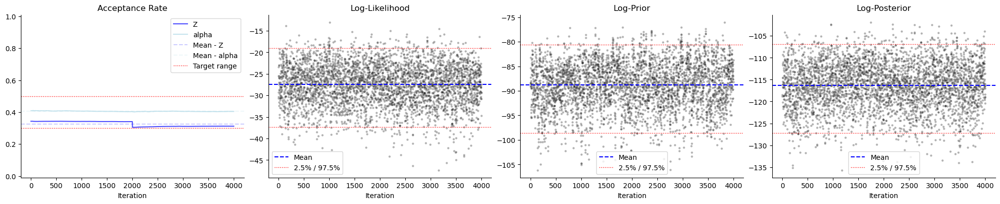

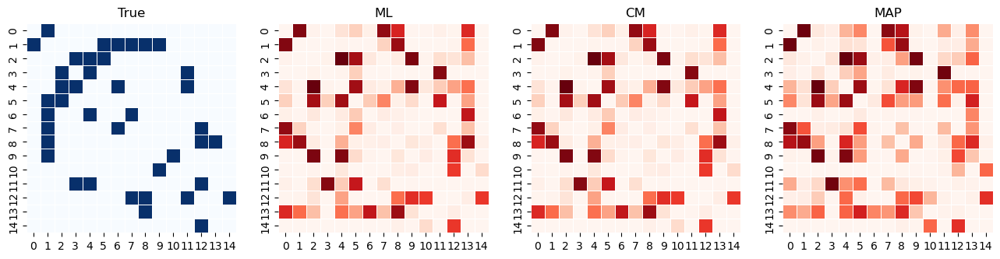

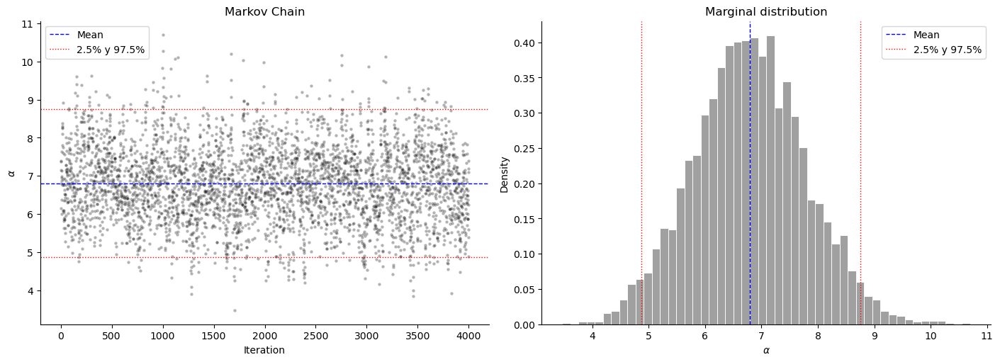

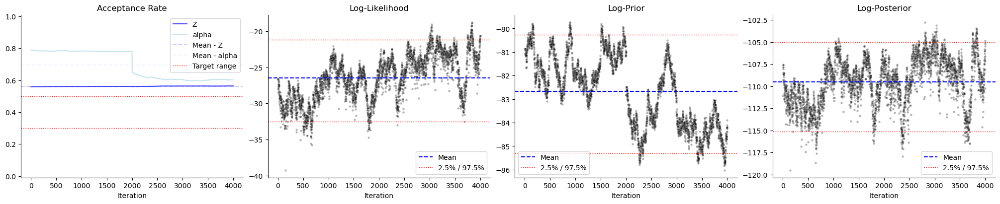

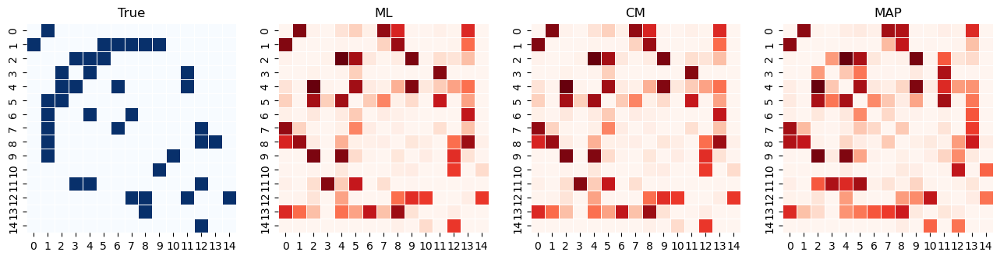

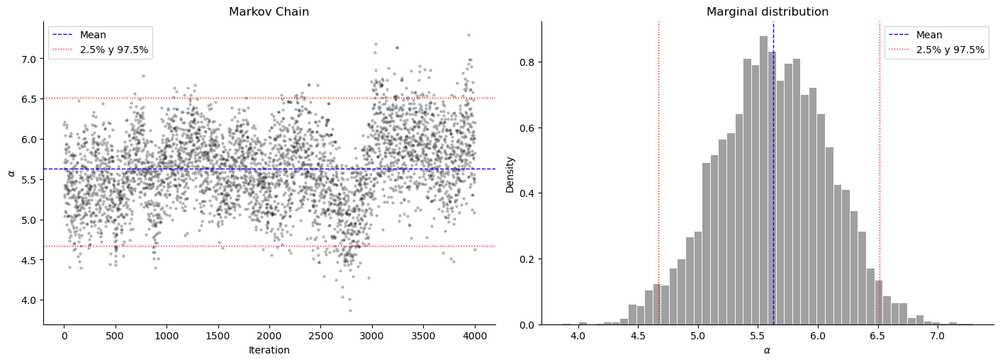

In [18]:
plot_mcmc_diagnostics_panel(resultsR3[0]) #MH
plot_mcmc_diagnostics_panel(resultsR3[1]) #HMC

## Spherical case

In [ ]:
# Configuration
Theta_S2 = {
    'Z0': random_VMF(np.array([0,0,1]), 0, size=n),
    'alpha0': np.float64(0.0),
    'beta0': np.float64(5.0),
    'rho': -0.5,
    'mu_alpha_beta': np.array([0.0, 10.0]),
    'sigma_prior_alpha': 5.0,
    'sigma_prior_beta': 1.0,
    'n_chains': 2,
    'n_samples': 2000,      
    'burn_in': 10000,       
    'thin': 10,             
    'sigma_q_Z': 1.0,       
    'sigma_q_alpha': 1.0,
    'sigma_q_beta': 1.0,
    'epsilon_Z': 0.1,
    'epsilon_alpha': 0.1,
    'epsilon_beta': 0.1    
}


# Estimation
resultsS2 = Estimation_LSMN_Samplers(Y, Theta_S2, Model="Spherical")

# Save results
handle_results(resultsS2, filepath='resultsS2.pkl', mode='save')

MH and HMC for Spherical latent space models on networks
Number of chains: 2
MH samples of size 2000 with burn-in 10000 and thinning 10
Number of draws per chain: 30000
Initial sigma_q_Z: 1.0000
Initial sigma_q_alpha: 1.0000
Initial sigma_q_beta: 1.0000
Log-likelihood: Bernoulli
------------------------------------------------------------
Searching for MLE using gradient ascent
Best log-likelihood after 20 starts: -50.3463
------------------------------------------------------------
Log-prior:
sigma_prior_alpha:  5.0
sigma_prior_beta:  1.0
------------------------------------------------------------
Starting MCMC sampling using Metropolis-Hastings
********************************
Chain 0
********************************


Sampling progress in MH:  33%|███▎      | 10031/30000 [00:39<01:17, 258.45 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 26.6470
Final sigma_q_alpha: 1.0777
Final sigma_q_beta: 1.7051


Sampling progress in MH: 100%|██████████| 30000/30000 [01:58<00:00, 252.78 draws/s]


********************************
Chain 1
********************************


Sampling progress in MH:  34%|███▎      | 10051/30000 [00:39<01:17, 258.67 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final sigma_q_Z: 26.2766
Final sigma_q_alpha: 0.9999
Final sigma_q_beta: 1.5666


Sampling progress in MH: 100%|██████████| 30000/30000 [01:59<00:00, 251.62 draws/s]


********************************
Trace convergence
********************************
Minimum R-hat: 0.9998
Maximum R-hat: 1.0183
Minimum ESS/n: 0.1538
Maximum ESS/n: 0.5956
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial           -139.7602         -57.9355        -197.6957
ML                 -50.3463        -104.7156        -155.0619
CM                 -21.1780         -42.2790         -63.4569
MAP                -15.9897         -42.6971         -58.6868
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 198.0479
DIC: 86.6488
BIC: 323.4721

Final acceptance rate Z: 0.5152
Final acceptance rate alpha: 0.4306
Final acceptance rate beta: 0.3877


Sampling progress in HMC:  33%|███▎      | 10001/30000 [35:53<1:12:40,  4.59 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final epsilon_Z: 0.0010
Final epsilon_alpha: 0.6074
Final epsilon_beta: 0.1528


Sampling progress in HMC: 100%|██████████| 30000/30000 [1:48:16<00:00,  4.62 draws/s]


********************************
Chain 1
********************************


Sampling progress in HMC:  33%|███▎      | 10002/30000 [35:24<1:10:49,  4.71 draws/s]

--------------------------------
Tuning complete
--------------------------------
Final epsilon_Z: 0.0010
Final epsilon_alpha: 0.6206
Final epsilon_beta: 0.7805


Sampling progress in HMC: 100%|██████████| 30000/30000 [1:48:12<00:00,  4.62 draws/s]  


********************************
Trace convergence
********************************
Minimum R-hat: 1.0000
Maximum R-hat: 1.0836
Minimum ESS/n: 0.0131
Maximum ESS/n: 0.4810
********************************
Point information
********************************
----------------------------------------------------------------
Point        Log-likelihood        Log-prior    Log-posterior
----------------------------------------------------------------
Initial           -139.7602         -57.9355        -197.6957
ML                 -50.3463        -104.7156        -155.0619
CM                 -16.8151         -41.9886         -58.8037
MAP                -14.8767         -42.0786         -56.9553
----------------------------------------------------------------
********************************
Model information criteria
********************************
WAIC: 135.5656
DIC: 77.9561
BIC: 287.3859

Final acceptance rate Z: 0.6299
Final acceptance rate alpha: 0.7580
Final acceptance rate beta: 0.7445


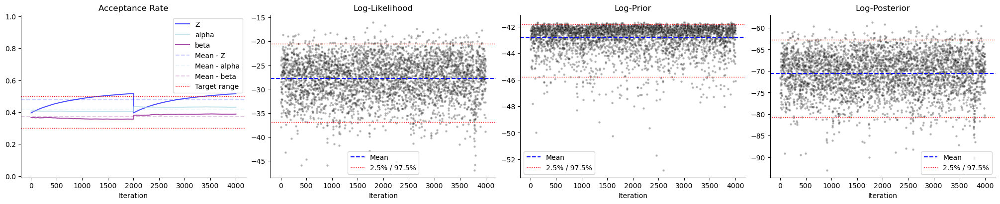

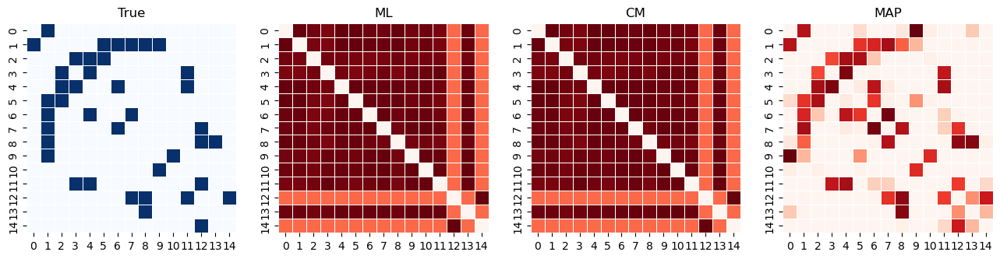

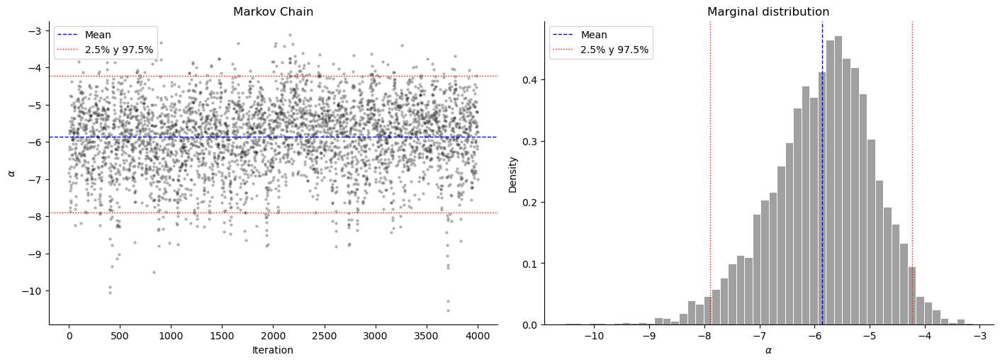

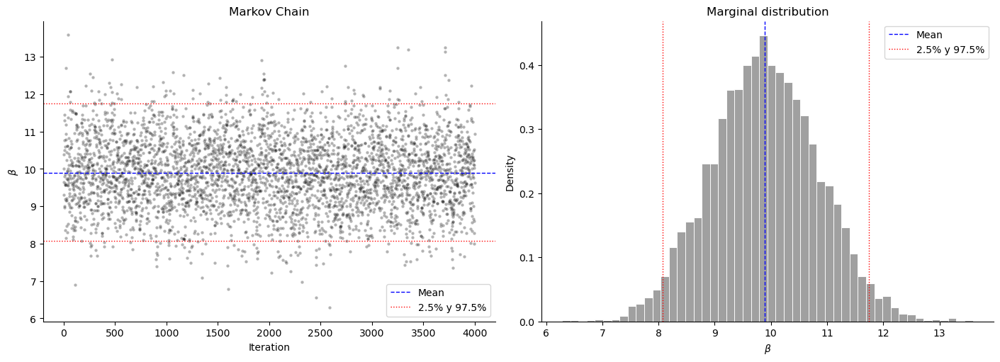

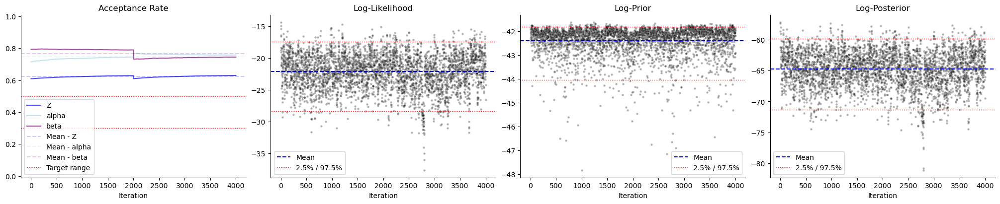

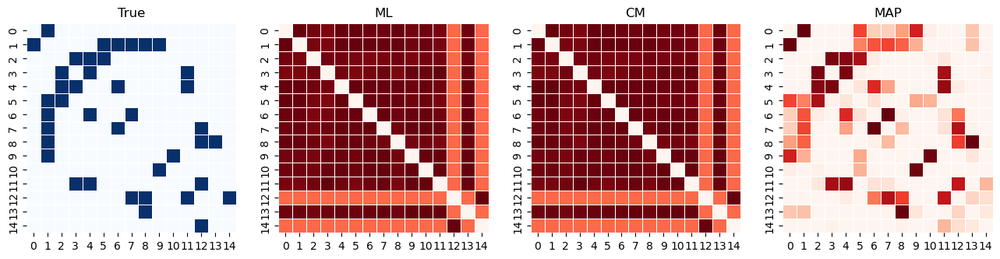

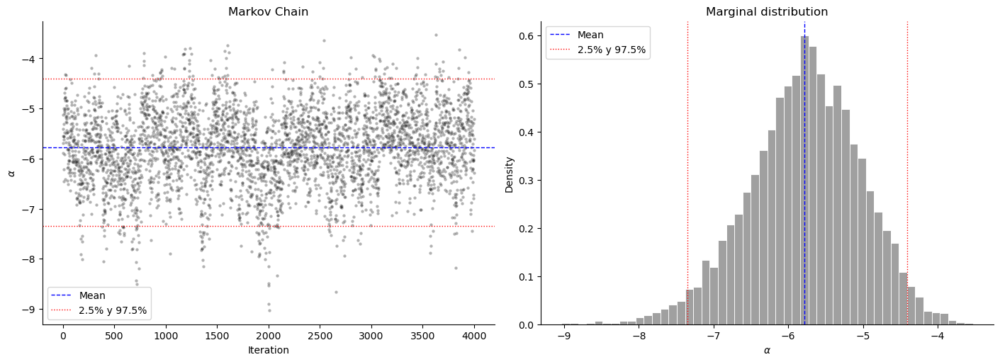

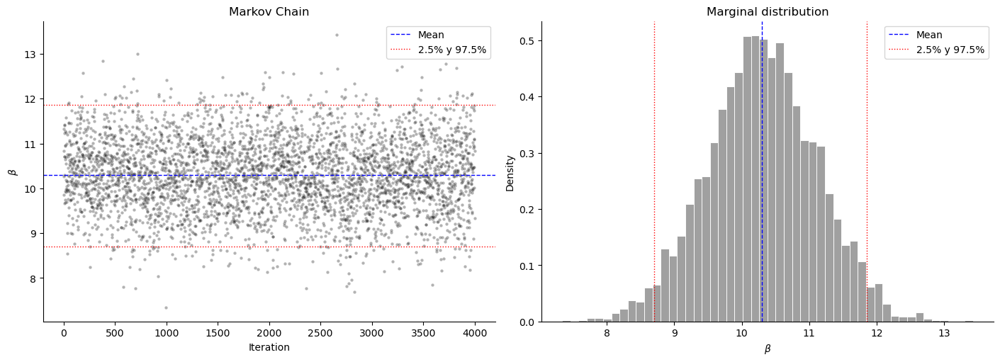

In [7]:
plot_mcmc_diagnostics_panel(resultsS2[0])
plot_mcmc_diagnostics_panel(resultsS2[1])

In [ ]:
#Visualizing latent space R^3
plot_latent_space(resultsR3[0]) #MH
plot_latent_space(resultsR3[1]) #HMC

In [17]:
#Visualizing latent space S^2 
plot_latent_space(resultsS2[0]) #MH
plot_latent_space(resultsS2[1]) #HMC

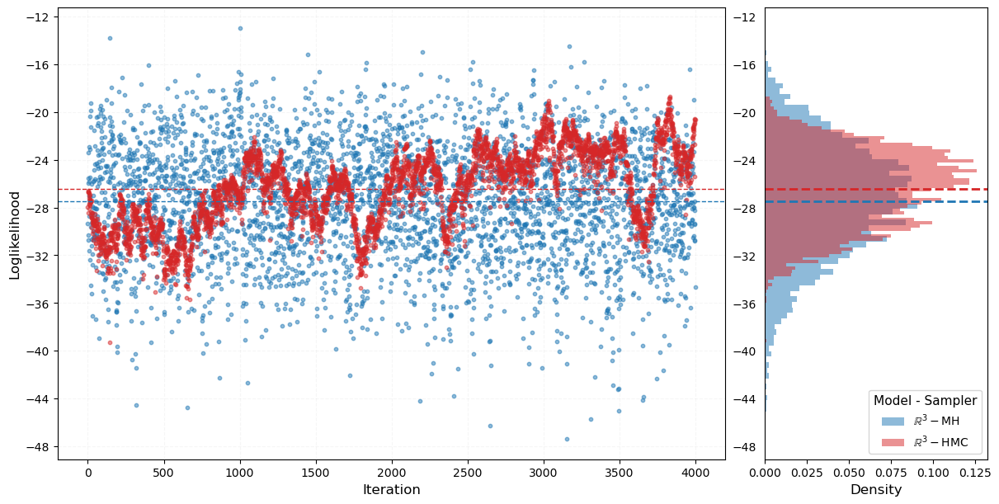

In [15]:
def plot_loglikelihood_comparison_models(results_dict, bins=75):
    """
    Plot the chain and the histograms of different models saved in results_dict
    """
    colors = {
        'R3_MH': '#1f77b4',  
        'R3_HMC': '#d62728'   
    }
    labels = {
        'R3_MH': r'$\mathbb{R}^3- \text{MH}$',
        'R3_HMC': r'$\mathbb{R}^3 - \text{HMC}$',
    }

    fig = plt.figure(figsize=(12, 6), constrained_layout=True)
    gs = fig.add_gridspec(4, 4)
    ax_main = fig.add_subplot(gs[:, :-1])
    ax_histy = fig.add_subplot(gs[:, -1], sharey=ax_main)

    for key, result in results_dict.items():
        y = result['log_likelihood']
        x = range(len(y))
        mean_y = np.mean(y)
        color = colors.get(key, 'gray')
        ax_main.scatter(x, y, alpha=0.5, s=10, label=labels[key], color=color)
        ax_main.axhline(mean_y, color=color, linestyle='--', linewidth=1)
        #q025, q975 = np.quantile(y, [0.025, 0.975])
        #ax_main.axhline(q025, color=color, linestyle=':', linewidth=1)
        #ax_main.axhline(q975, color=color, linestyle=':', linewidth=1)

        ax_histy.hist(y, bins=bins, orientation='horizontal', color=color, alpha=0.5, density=True, label=labels[key])
        ax_histy.axhline(mean_y, color=color, linestyle='--', linewidth=2)


    ax_main.set_xlabel("Iteration", fontsize=12)
    ax_main.set_ylabel("Loglikelihood", fontsize=12)
    ax_main.grid(True, linestyle='--', alpha=0.1)
    #ax_main.legend(fontsize=11)

    ax_histy.set_xlabel("Density", fontsize=12)
    ax_histy.tick_params(axis='y', left=False)
    ax_histy.yaxis.set_major_locator(plt.MaxNLocator(nbins=12))
    ax_histy.legend(title="Model - Sampler", loc='lower right', fontsize=10, title_fontsize=11)
    ax_histy.grid(False)

    plt.show()

plot_loglikelihood_comparison_models({
    'R3_MH': resultsR3[0],
    'R3_HMC': resultsR3[1]
})

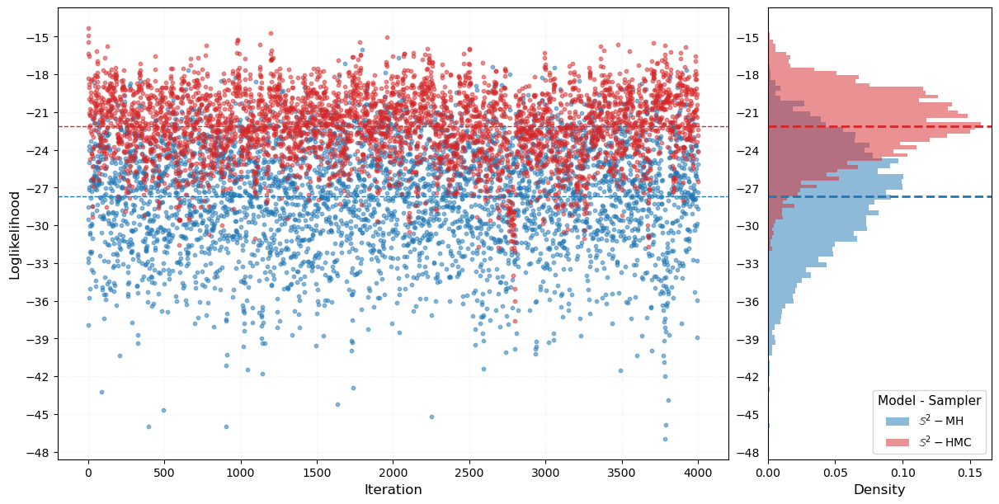

In [14]:

def plot_loglikelihood_comparison_models(results_dict, bins=75):
    """
    Plot the chain and the histograms of different models saved in results_dict
    """
    colors = {
        'S2_MH': '#1f77b4',  
        'S2_HMC': '#d62728'   
    }
    labels = {
        'S2_MH': r'$\mathbb{S}^2- \text{MH}$',
        'S2_HMC': r'$\mathbb{S}^2 - \text{HMC}$',
    }

    fig = plt.figure(figsize=(12, 6), constrained_layout=True)
    gs = fig.add_gridspec(4, 4)
    ax_main = fig.add_subplot(gs[:, :-1])
    ax_histy = fig.add_subplot(gs[:, -1], sharey=ax_main)

    for key, result in results_dict.items():
        y = result['log_likelihood']
        x = range(len(y))
        mean_y = np.mean(y)
        color = colors.get(key, 'gray')
        ax_main.scatter(x, y, alpha=0.5, s=10, label=labels[key], color=color)
        ax_main.axhline(mean_y, color=color, linestyle='--', linewidth=1)
        #q025, q975 = np.quantile(y, [0.025, 0.975])
        #ax_main.axhline(q025, color=color, linestyle=':', linewidth=1)
        #ax_main.axhline(q975, color=color, linestyle=':', linewidth=1)

        ax_histy.hist(y, bins=bins, orientation='horizontal', color=color, alpha=0.5, density=True, label=labels[key])
        ax_histy.axhline(mean_y, color=color, linestyle='--', linewidth=2)


    ax_main.set_xlabel("Iteration", fontsize=12)
    ax_main.set_ylabel("Loglikelihood", fontsize=12)
    ax_main.grid(True, linestyle='--', alpha=0.1)
    #ax_main.legend(fontsize=11)

    ax_histy.set_xlabel("Density", fontsize=12)
    ax_histy.tick_params(axis='y', left=False)
    ax_histy.yaxis.set_major_locator(plt.MaxNLocator(nbins=12))
    ax_histy.legend(title="Model - Sampler", loc='lower right', fontsize=10, title_fontsize=11)
    ax_histy.grid(False)

    plt.show()

plot_loglikelihood_comparison_models({
    'S2_MH': resultsS2[0],
    'S2_HMC': resultsS2[1]
})